In [1]:
# from IPython.core.display import HTML
# HTML("""
# <link rel="stylesheet" type="text/css" href="https://cdnjs.cloudflare.com/ajax/libs/semantic-ui/2.2.11/semantic.min.css">

# <link rel="stylesheet" type="text/css" href="https://raw.githubusercontent.com/ga-students/DS_HK_14/master/lessons/lesson-11/code/starter-code/custom.css">


# <script>
#     var code_show=true; //true -> hide code at first

#     function code_toggle() {
#         // $('div.prompt').hide(); // always hide prompt

#         if (code_show){
#             $('div.input').hide();
#         } else {
#             $('div.input').show();
#         }
#         code_show = !code_show
#     }
#     // $( document ).ready(code_toggle);
# </script>

# <a class="ui large orange inverted button" style="margin:0 auto; display:block;" href="javascript:code_toggle()">Toggle Code</a> 
# """)

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go  
import cufflinks as cf
import colorlover as cl
init_notebook_mode()
cf.go_offline()
cf.set_config_file(theme='polar')

import warnings
warnings.filterwarnings('ignore')

color= '#A2D5F2'

In [3]:
# dictionary for current generation consoles platform 
dict_platform = {'Xbox One':'XOne', 'Nintendo Switch':'NS', 'Wii U':'WiiU', 'PlayStation 4':'PS4'}
# Only foucs on current generation consoles
targetPlatform = ['PS4','XOne','WiiU','NS']


# Game review data from IGN 
df_IGN = pd.read_csv('IGN_review.csv', sep = '\t')
df_IGN['gamePlatformAlias'] = df_IGN.gamePlatform.map(dict_platform)

# IGN game review comment count
df_IGN_comment = pd.read_csv('df_IGN_Comment.csv', sep = '\t')
df_IGN_comment.commentCounts = df_IGN_comment.commentCounts.astype(int)
df_IGN_comment.commentLookings = df_IGN_comment.commentLookings.astype(int)

# Game rating from gamerankings.com
df_rank = pd.read_csv('df_review.csv', sep = '\t')
df_rank['mth'] = df_rank.reviewDate.apply(lambda x: int(x[:2]))
df_rank['yr'] = df_rank.reviewDate.apply(lambda x: int('20'+ x[-2:]))
df_rank.platform.replace({'WIIU':'WiiU','XONE':'XOne'}, inplace=True)
df_rank_target = df_rank[df_rank.platform.isin(targetPlatform)]
# Clean up some error data
df_rank_target.drop(df_rank_target[df_rank_target.yr == 2092].index, inplace = True)

# Game sales data from vgchartz.com
df_sales = pd.read_csv('Game_Sales.csv', sep = '\t')
df_sales_target = df_sales[df_sales.platform.isin(targetPlatform)]

# IGN full game review 
df_IGN_review = pd.read_csv('IGN_review_Detail.csv', sep = '\t')
# df_IGN.info()
# df_sales_target.info()
# df_IGN_comment.info()
# df_rank_target.info()

## Data

### IGN Users comment count
IGN user's comment count and follow of every single review

In [4]:
df_IGN_comment.head()

,commentCounts,commentLookings,gameReviews
0,216,43,http://www.ign.com/articles/2017/09/05/pillars...
1,83,29,http://www.ign.com/articles/2017/08/30/giganti...
2,1032,231,http://www.ign.com/articles/2017/08/23/madden-...
3,455,134,http://www.ign.com/articles/2017/06/06/dirt-4-...
4,88,34,http://www.ign.com/articles/2017/05/25/percept...


### Game review data from IGN

In [5]:
df_IGN.head()

,gameCover,gameGenre,gamePhrase,gamePlatform,gameRating,gameReview,gameTitle,gameCoverID,gamePlatformAlias
0,http://assets1.ignimgs.com/2017/06/24/pillars-...,RPG,Great,Xbox One,8.5,http://www.ign.com/articles/2017/09/05/pillars...,Pillars of Eternity: Complete Edition,0,XOne
1,http://assets1.ignimgs.com/2015/08/03/gigantic...,Strategy,Good,Xbox One,7.5,http://www.ign.com/articles/2017/08/30/giganti...,Gigantic,1,XOne
2,http://assets1.ignimgs.com/2017/08/24/madden-1...,Sports,Great,Xbox One,8.6,http://www.ign.com/articles/2017/08/23/madden-...,Madden NFL 18,2,XOne
3,http://assets1.ignimgs.com/2017/01/26/dirt-4--...,Racing,Amazing,Xbox One,9.2,http://www.ign.com/articles/2017/06/06/dirt-4-...,Dirt 4,3,XOne
4,http://assets2.ignimgs.com/2015/05/26/percepti...,Adventure,Bad,Xbox One,4.8,http://www.ign.com/articles/2017/05/25/percept...,Perception,4,XOne


### Game Sales Data from vgchartz.com

In [6]:
df_sales_target.head()

,EU,GL,JP,NA,OT,genre,platform,pub,title,year,mGame
7225,0.92,3.31,0.54,1.60,0.25,Action,NS,Nintendo,The Legend of Zelda: Breath of the Wild,2017,1
7226,0.77,2.53,0.58,1.01,0.17,Racing,NS,Nintendo,Mario Kart 8 Deluxe,2017,1
7227,0.22,0.70,0.24,0.20,0.04,Misc,NS,Nintendo,1-2-Switch,2017,0
7228,0.13,0.69,0.20,0.31,0.05,Fighting,NS,Nintendo,Arms,2017,0
7229,0.12,0.39,0.10,0.15,0.02,Puzzle,NS,Konami Digital Entertainment,Super Bomberman R,2017,0


### Game reviews from gamerankings.com

In [7]:
df_rank_target.head()

,gameTitle,platform,rating,reviewDate,site,fscore,score,title,rating_sync,mth,yr
16029,Deadlight: Director's Cut (PS4),PS4,7.2/10,06/21/16,ActionTrip,10.0,7.2,Deadlight: Director's Cut,0.7,6,2016
16030,Odin Sphere Leifthrasir (PS4),PS4,8.5/10,06/06/16,ActionTrip,10.0,8.5,Odin Sphere Leifthrasir,0.8,6,2016
16031,Dead Island: Definitive Collection (PS4),PS4,6.5/10,06/01/16,ActionTrip,10.0,6.5,Dead Island: Definitive Collection,0.6,6,2016
16032,Teenage Mutant Ninja Turtles: Mutants in Manha...,PS4,5/10,05/27/16,ActionTrip,10.0,5.0,Teenage Mutant Ninja Turtles: Mutants in Manha...,0.5,5,2016
16033,DOOM (PS4),PS4,8.5/10,05/20/16,ActionTrip,10.0,8.5,DOOM,0.8,5,2016


### IGN full game review

In [8]:
df_IGN_review.head()

,author,reviewLink,reviews
0,Leif Johnson,http://www.ign.com/articles/2017/09/05/pillars...,"If you'd asked me a year ago, I might have to..."
1,Jason Fanelli,http://www.ign.com/articles/2017/08/30/giganti...,Its huge monsters put on a great and imposing...
2,Dustin Toms,http://www.ign.com/articles/2017/08/23/madden-...,Ask Tom Brady and Matt Ryan what they think a...
3,Luke Reilly,http://www.ign.com/articles/2017/06/06/dirt-4-...,If 2015’s Dirt Rally was Codemasters flipping...
4,Joe Skrebels,http://www.ign.com/articles/2017/05/25/percept...,Perception invokes the most basic human phobi...


### ECDF

In [9]:
def ecdf (df, field, title):
    x = df[field].sort_values().tolist()
    y = np.arange(1, len(x)+1) / float(len(x))
    pd.DataFrame(zip(y,x)).set_index(1).iplot(mode = 'markers' , title = title, color=color)

In [10]:
ecdf(df_IGN_comment,'commentCounts','Comment Count ECDF')
ecdf(df_rank_target,'rating_sync','Game Rating (from 0 - 1) ECDF')
ecdf(df_sales_target, 'GL', 'Global Game Sales (Million) ECDF')
ecdf(df_sales_target, 'EU', 'Euro Game Sales (Million) ECDF')
ecdf(df_sales_target, 'JP', 'Japan Game Sales (Million) ECDF')
ecdf(df_sales_target, 'NA', 'North America Game Sales (Million) ECDF')

#### Observations
1. Number of comments under IGN game review mostly under 20K
1. Most of the game ratings are at 0.8
1. Most of the game sales are under 0.5 million
1. Game sales at Japan are much lower than EU and NA (around 0.1 million)

### Game Rating

In [11]:
df_rank.groupby(['site']).count().max(1).sort_values(ascending = False).head(20).iplot(kind='bar',barmode='stack',
                                                                                      title = 'Top 20 game review website',
                                                                                      yTitle = 'Review Count',
                                                                                      color= color)

In [12]:
df_temp = df_rank_target.groupby(['site', 'platform']).count().max(1).unstack()
df_temp['total'] = df_temp.NS + df_temp.PS4 + df_temp.WiiU + df_temp.XOne
df_temp.sort_values('total', ascending = False)[['NS','PS4','WiiU','XOne']].head(20).iplot(
                                                        kind = 'bar',
                                                        barmode = 'stack',
                                                        title ='Top 20 game review website in current console generations',
                                                        yTitle = 'Review Count')

#### Observations
1. IGN published the most review among others all time.
2. However at current console generation, COGconnected and other 10 review websites surpass IGN.

### Game Rating VS Game Sales

In [13]:
df_sale_rank = pd.merge(df_rank_target,df_sales_target, on=['platform','title'] )

layout = go.Layout(
        xaxis=dict(
            range=[0,1.05],
            dtick = 0.1,
            title = 'Rating'
        ),
        yaxis=dict(
            title = 'Global Sales (million)'
        ),
        title = 'Rating vs Sales'
    )

df_sale_rank[['rating_sync','GL']].drop_duplicates().iplot(kind = 'scatter',
                                         mode = 'markers',
                                         x='rating_sync',
                                         y='GL',
                                         layout=layout,
                                         color= color)

#### Observations
1. No game can sell more than 2 million if rating is under 0.3 

### Game release date

In [14]:
con = df_rank_target.site == 'IGN'
df_temp = pd.DataFrame(df_rank_target[con].groupby(['title','platform']).first()[['mth','yr']]).reset_index()
layout = go.Layout(
        xaxis=dict(
            range=[0.5,12.5],
            dtick = 1,
            title = 'Releases Month'
        ),
        yaxis=dict(
            title = 'Game Count'
        ),
        title = 'Releases On Months (Most of the games are released on Nov)',
        barmode='stack'
    )
# color= '#3399ff'
df_temp.groupby(['mth','platform']).count().max(1).unstack().iplot( kind='bar',layout=layout,colorscale='Pastel2')

#### Observations:
1. Most of the games are released on November

In [15]:
layout = go.Layout(
        xaxis=dict(
            title = 'Releases Year'
        ),
        yaxis=dict(
            title = 'Game Count'
        ),
        title = 'Releases On Year (As of Sep 2017)',
        barmode='stack'
    )

df_temp.groupby(['yr','platform']).count().max(1).unstack().iplot(kind='bar',layout=layout)


#### Observations
1. PS4 games releases are keep increasing
2. Nintendo Switch(NS) is going to replace WillU at 2017
3. Xbox One is dying

### Genre vs Comment vs Rating 

In [16]:
df_temp = pd.merge(df_IGN,df_IGN_comment, left_on ='gameReview', right_on='gameReviews')

In [17]:
df_temp.groupby('gamePhrase').sum().commentCounts.sort_values(ascending = False).iplot(kind='bar',color=color, title = 'Comment vs Phase', yTitle = 'Comment Count')

In [18]:
df_temp.groupby('gameRating').sum().commentCounts.iplot(kind='bar',color=color, xTitle = 'Rating (1-10)', yTitle = 'Comment Count', title = 'Game Rating vs Comment Count')

In [19]:
df_temp.groupby(['gameGenre']).sum().commentCounts.sort_values(ascending = False).head(20).iplot(kind = 'bar', barmode ='stack',
                                                                                       yTitle = 'Comment Count',
                                                                                        xTitle = 'Genre',
                                                                                       title = 'IGN User\'s Comment On Different Genre',
                                                                                        color= color)

#### Observations
1. IGN user leave more comments on "Amazing" (point 9) game
2. IGN user like Action and Shooter games

### Common Game Title 

In [20]:
from wordcloud import WordCloud,STOPWORDS, ImageColorGenerator
from PIL import Image
stopwords = set(STOPWORDS)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 12
fig_size[1] = 12

In [21]:
def showWordCloud(path, text):
    mask = np.array(Image.open(path))
    image_colors = ImageColorGenerator(mask)
    wc = WordCloud(background_color="white", max_words=5000, 
                   stopwords=stopwords, max_font_size=30, random_state=42,mask=mask)
    wc.generate(text)
    plt.imshow(wc.recolor(color_func=image_colors), interpolation='bilinear')
    plt.axis("off")
    plt.show()

### The most common words in games titles from 1985 - 2017

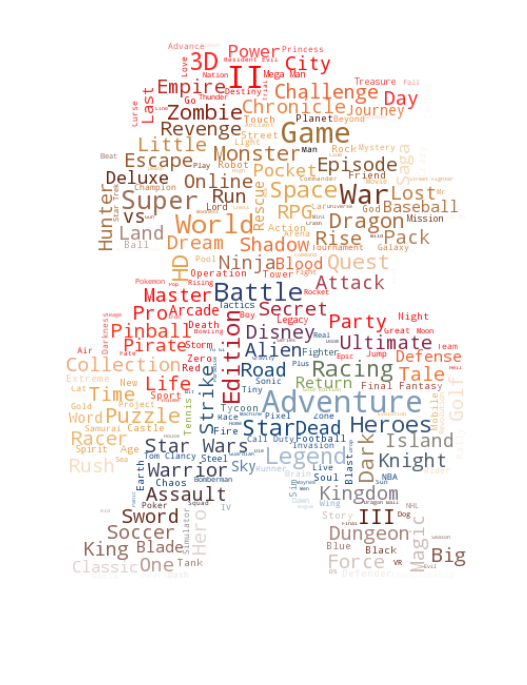

In [22]:
titles = df_rank.title.drop_duplicates().dropna()
a=''
for x in titles:
    a += x.strip() + ' '
path = 'image\cloud04.jpg'
showWordCloud(path, a)

### The most common words in games titles in current generation consoles (2012 - 2017)

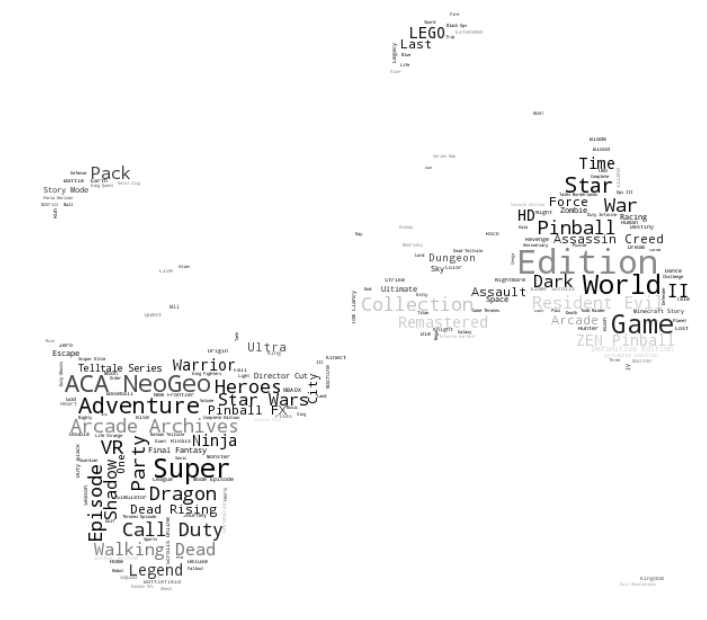

In [23]:
titles = df_rank_target.title.drop_duplicates().dropna()
a=''
for x in titles:
    a += x.strip() + ' '
path = 'image\mario05.jpg'
showWordCloud(path, a)

### The most common words in IGN game review

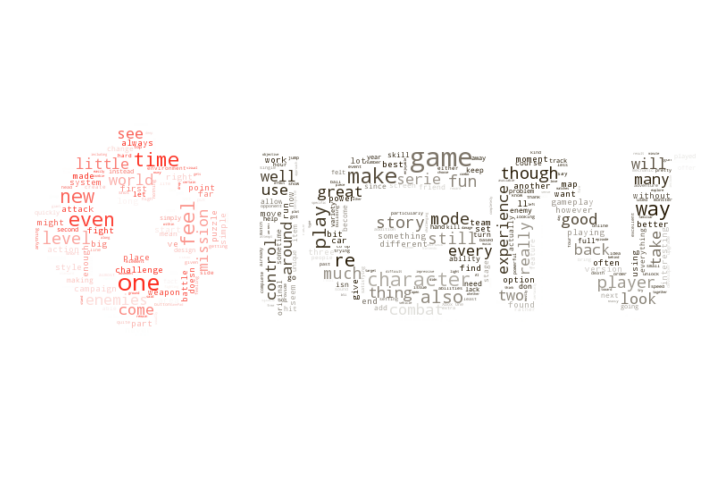

In [24]:
# IGN review detail
df_IGN_review = pd.read_csv('IGN_review_Detail.csv', sep = '\t')
titles = df_IGN_review.reviews.drop_duplicates().dropna()
a=''
for x in titles:
    a += x.strip() + ' '
path = 'image\IGN.jpg'
showWordCloud(path, a)

### Highest Rating Game Publisher

In [25]:
df = pd.merge(df_rank_target,df_sales_target, on = ['platform','title'])

In [26]:
con = ['gameTitle','pub']
# top 15 pub
df[con].drop_duplicates().pub.value_counts().head(15).iplot(kind = 'bar',title = 'Top 15 Game Publisher', yTitle = '# of Game Realese')
temp = df[con].drop_duplicates().pub.value_counts().head(15)
con = df.pub.isin(temp.index.tolist())
df[con].groupby('pub').mean().rating_sync.sort_values(ascending=False).head(15).iplot(kind = 'bar',title = 'Average Rating of Top 15 Publisher ', yTitle = 'Rating', color = color)

#### Observations
1. Since "Bthesda Softworks" published the least games among others, and there it gets the highest average rating.
1. Sony and Nintendo are doing pretty well acutally.

### Game Review Bias
Game review websites who give higher rating to specific platform

In [27]:
for x in df.platform.unique():
    con = df.platform == x
    df[con].groupby(['site']).mean()[['rating_sync']].sort_values('rating_sync',ascending = False).head(20).iplot(kind = 'bar'
                                                    , title = x + ' Average Rating = %.2f' %df[con].mean().rating_sync
                                                    , yTitle = 'Average Rating'
                                                    , xTitle = 'Review website'
                                                    ,color = color)

#### Observations
1. 7 review websites give full marks to every single game on Nintendo Switch.